# Cars4You - Handout Project | Group 42
## Notebook 1 — Models Lab
**Course:** MSc in Data Science and Advanced Analytics, NOVA IMS (2025/2026)  

**Author(s):** Group 42
- `Miguel Matos - 20221925`
- `Andre Nicolau - 20221918`
- `André Ferreira - 20250398`


---

#### <font> Table of Contents </font> <a class="anchor" id='toc'></a> 
1. [Imports](#Imports)  
2. [Halving Random Search for Preprocess Parameters Tuning](#halving-random-search-for-preprocess-parameters-tuning) 
- 2.1. [Random Forest](#random-forest-preproc)
- 2.2. [Decision Tree](#decision-tree-preproc)
- 2.3. [Extra Trees](#extra-trees-preproc)
- 2.4. [Hist Gradient Boosting](#hist-gradient-boosting-preproc)
- 2.5. [K Neighbours](#kneighbours-preproc)

3. [Halving Random Search for Models Tuning](#halving-random-search-for-models-tuning) 
- 3.1. [Random Forest](#random-forest-model)
- 3.2. [Decision Tree](#decision-tree-model)
- 3.3. [Extra Trees](#extra-trees-model)
- 3.4. [Hist Gradient Boosting](#hist-gradient-boosting-model)
- 3.5. [K Neighbours](#kneighbours-model)

4. [Halving Random Search Models Analysis](#halving-random-search-models-analysis) 
- 4.1. [Random Forest](#random-forest-analysis)
- 4.2. [Decision Tree](#decision-tree-analysis)
- 4.3. [Extra Trees](#extra-trees-analysis)
- 4.4. [Hist Gradient Boosting](#hist-gradient-boosting-analysis)
----

After completing our exploratory data analysis and data cleaning, we moved on to the preprocessing steps. Because we are using a custom pipeline (Nuestra_Pipeline) to train our models with cross-validation and perform hyperparameter tuning, we built an individual custom class for each preprocessing step (inside Preprocessing_pipelines). Each class includes custom strategies that handle specific preprocessing tasks. This design allows us to include preprocessing choices as hyperparameters in our search grid when looking for the best model.

This notebook is the first step in our search process. Here, we use HalvingRandomSearchCV, a hyperparameter-tuning technique that begins by training a large number of candidate models using small amounts of data. After the initial evaluation, only the best candidates are trained on larger datasets in subsequent rounds. We chose this method as our initial search strategy because it allows us to explore a broader hyperparameter space than a regular RandomizedSearchCV while being computationally cheaper. Once we identify the region of the hyperparameter space that yields the best scores, we plan to run Bayes searches around those values to find the true best model.

# Imports
[Back to TOC](#toc)

In [20]:
from utils.functions import *
from utils.Nuestra_Pipeline import NuestraPipeline
from Preprocessing_pipelines.Outliers_pipeline import OutliersDealer
from Preprocessing_pipelines.Missing_Values_pipeline import MissingValuesDealer
from Preprocessing_pipelines.Encoding_pipeline import EncodingDealer
from Preprocessing_pipelines.Scaling_pipeline import ScalingDealer
from Preprocessing_pipelines.Feature_Selection_pipeline import FeatureSelectionDealer
import warnings

# Suppress this specific warning
warnings.filterwarnings('ignore', 
                       message='X does not have valid feature names',
                       category=UserWarning,
                       module='sklearn.utils.validation')

data = pd.read_csv("../data/data_cleaned.csv", index_col= "carID")
pd.set_option("display.max_columns", None)

In [21]:
data = data.sample(frac=1).reset_index(drop=True)

As the objective is to create a predictive model that is accurate without the need of the mechanic's assessment, we'll drop the "paintQuality%" column.

In [22]:
data.drop("paintQuality%", axis = 1, inplace= True)

In [23]:
X = data.drop("price", axis= 1)
y = data["price"]

# Halving Random Search for Preprocess Parameters Tuning

Our first goal is to identify the best combination of preprocessing parameters to use when training each models. To do this, we perform a Halving Random Search for each model using a set of standard parameters. We didn't use default model parameters because, for some models, the defaults can lead to severe overfitting, so we adjusted them beforehand.
We found 200 as number of candidates, factor of 2, Cross-Validation with 3 folds and 2000 minimum resources to be resonable options for the parameters of our Halving Random Seach runs as they explore a good space of options and they didn't take to long to run.

(Note: We could include the preprocessing parameters directly in the hyperparameter search when tuning the models. However, we found this approach to be extremely computationally expensive. Therefore, we decided to first find a good preprocessing configuration and then proceed to the model-tuning stage.)

### Random Forest Preproc

In [8]:
rf = RandomForestRegressor(
    n_estimators=100,          # Reduced from 150 for faster training
    max_depth=12,              
    min_samples_split=10,      # Increased to reduce tree complexity
    min_samples_leaf=4,        # Increased to reduce overfitting and speed up
    max_features="sqrt",              
    random_state=42
)

parameters = {
              "imputer__imputation_method": ["knn_modelwise", "simple", "iterative"],
              "imputer__knn_neighbors": np.arange(5,21),
              "imputer__knn_scaling_method" : ["standard", "minmax", "robust"],
              "outlier_remover__outlier_method" : ["Isolation_Forest", "LOF", "IQR", "z_score"],
              "outlier_remover__mod_outliers_cols" : [["car_age", "mileage", "tax", "mpg"], ["tax", "mpg"]],
              "outlier_remover__sev_outliers_cols" : [["car_age", "mileage", "engineSize"], ["car_age", "mileage"]],
              "outlier_remover__threshold" : [2,3],
              "outlier_remover__z_columns" : [["car_age", "mileage", "tax", "mpg"]],
              "outlier_remover__contamination_IF" : [0.05, 0.15, 0.3, 0.5],
              "outlier_remover__n_neighbors": [30, 50, 70, 90, 100],
              "outlier_remover__contamination_LOF" : [0.05, 0.15, 0.3, 0.5],
              "outlier_remover__model_columns" : [["tax", "mpg"], ["car_age", "mileage", "tax", "mpg"], ["car_age", "mileage", "tax", "mpg", "engineSize"]],
              "encoder__method" : ["target", "freq"],
              "scaler__scaler_name" : ["robust", "minmax", "standard"],
              "selector__selection_method": ["kbest", "model", "rfe"],
              "selector__k": np.arange(5,11),
              "selector__model_name" : ["rf"],
              "selector__n_features_to_select": np.arange(5,11),
              "model": [rf]
    }

pipeline = NuestraPipeline(MissingValuesDealer(),
                           OutliersDealer(),
                           EncodingDealer(), 
                           ScalingDealer(),
                           FeatureSelectionDealer(),
                           rf)

mae_scorer = make_scorer(mean_absolute_error, greater_is_better=False)

HRS_parameters_rf = HalvingRandomSearchCV(
                                      pipeline, 
                                      parameters,
                                      n_candidates=200,      
                                      factor=2,    
                                      min_resources = 2000,         
                                      scoring=mae_scorer, 
                                      verbose=3, 
                                      cv=3,                 
                                      n_jobs= 4,            
                                      random_state=42)

In [6]:
HRS_parameters_rf.fit(X, y)

n_iterations: 6
n_required_iterations: 8
n_possible_iterations: 6
min_resources_: 2000
max_resources_: 75973
aggressive_elimination: False
factor: 2
----------
iter: 0
n_candidates: 200
n_resources: 2000
Fitting 3 folds for each of 200 candidates, totalling 600 fits
[CV 2/3] END encoder__method=freq, imputer__imputation_method=simple, imputer__knn_neighbors=12, imputer__knn_scaling_method=minmax, model=RandomForestRegressor(max_depth=12, max_features='sqrt', min_samples_leaf=4,
                      min_samples_split=10, random_state=42), outlier_remover__contamination_IF=0.5, outlier_remover__contamination_LOF=0.5, outlier_remover__mod_outliers_cols=['car_age', 'mileage', 'tax', 'mpg'], outlier_remover__model_columns=['car_age', 'mileage', 'tax', 'mpg', 'engineSize'], outlier_remover__n_neighbors=70, outlier_remover__outlier_method=Isolation_Forest, outlier_remover__sev_outliers_cols=['car_age', 'mileage', 'engineSize'], outlier_remover__threshold=2, outlier_remover__z_columns=['car_a

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/joblib/externals/loky/process_executor.py:752: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


[CV 1/3] END encoder__method=target, imputer__imputation_method=simple, imputer__knn_neighbors=19, imputer__knn_scaling_method=standard, model=RandomForestRegressor(max_depth=12, max_features='sqrt', min_samples_leaf=4,
                      min_samples_split=10, random_state=42), outlier_remover__contamination_IF=0.05, outlier_remover__contamination_LOF=0.15, outlier_remover__mod_outliers_cols=['tax', 'mpg'], outlier_remover__model_columns=['tax', 'mpg'], outlier_remover__n_neighbors=30, outlier_remover__outlier_method=LOF, outlier_remover__sev_outliers_cols=['car_age', 'mileage'], outlier_remover__threshold=2, outlier_remover__z_columns=['car_age', 'mileage', 'tax', 'mpg'], scaler__scaler_name=standard, selector__k=10, selector__model_name=rf, selector__n_features_to_select=6, selector__selection_method=model;, score=(train=-1553.491, test=-1930.129) total time=   1.5s
[CV 1/3] END encoder__method=target, imputer__imputation_method=knn_modelwise, imputer__knn_neighbors=17, imputer__k

,estimator,NuestraPipeli...ctionDealer())
,param_distributions,"{'encoder__method': ['target', 'freq'], 'imputer__imputation_method': ['knn_modelwise', 'simple', ...], 'imputer__knn_neighbors': array([ 5, 6..., 18, 19, 20]), 'imputer__knn_scaling_method': ['standard', 'minmax', ...], ...}"
,n_candidates,200
,factor,2
,resource,'n_samples'
,max_resources,'auto'
,min_resources,2000
,aggressive_elimination,False
,cv,3
,scoring,make_scorer(m...hod='predict')
,refit,True


In [6]:
#rf_params = pd.DataFrame(HRS_parameters_rf.cv_results_)
#rf_params.to_csv("../data/final_data/HRS_preproc/RF_params.csv")

#joblib.dump(HRS_parameters_rf.best_estimator_, 'models/models_organized/rf_params.pkl')
rf_parameters = joblib.load('models/models_organized/rf_params.pkl')

#rf_params.tail()

### Decision Tree Preproc

In [10]:
dt = DecisionTreeRegressor(
    max_depth=10,
    min_samples_split=10,      # Increased for speed
    min_samples_leaf=4,        # Increased for speed
    max_features="sqrt",
    random_state=42
)

parameters = {
              "imputer__imputation_method": ["knn_modelwise", "simple", "iterative"],
              "imputer__knn_neighbors": np.arange(10,21),
              "imputer__knn_scaling_method" : ["standard", "minmax", "robust"],
              "outlier_remover__outlier_method" : ["Isolation_Forest", "LOF", "IQR", "z_score"],
              "outlier_remover__mod_outliers_cols" : [["car_age", "mileage", "tax", "mpg"], ["tax", "mpg"]],
              "outlier_remover__sev_outliers_cols" : [["car_age", "mileage", "engineSize"], ["car_age", "mileage"]],
              "outlier_remover__threshold" : [2,3],
              "outlier_remover__z_columns" : [["car_age", "mileage", "tax", "mpg"]],
              "outlier_remover__contamination_IF" : [0.05, 0.15, 0.3, 0.5],
              "outlier_remover__n_neighbors": [30, 50, 70, 90, 100],
              "outlier_remover__contamination_LOF" : [0.05, 0.15, 0.3, 0.5],
              "outlier_remover__model_columns" : [["tax", "mpg"], ["car_age", "mileage", "tax", "mpg"], ["car_age", "mileage", "tax", "mpg", "engineSize"]],
              "encoder__method" : ["target", "freq"],
              "scaler__scaler_name" : ["robust", "minmax", "standard"],
              "selector__selection_method": ["kbest", "model", "rfe"],
              "selector__k": np.arange(5,11),
              "selector__model_name" : ["dt"],
              "selector__n_features_to_select": np.arange(5,11),
              "model": [dt]
              }

pipeline = NuestraPipeline(MissingValuesDealer(),
                           OutliersDealer(),
                           EncodingDealer(), 
                           ScalingDealer(),
                           FeatureSelectionDealer(),
                           dt)

mae_scorer = make_scorer(mean_absolute_error, greater_is_better=False)

HRS_parameters_dt = HalvingRandomSearchCV(
                                      pipeline, 
                                      parameters,
                                      n_candidates=200,      
                                      factor=2,    
                                      min_resources = 2000,         
                                      scoring=mae_scorer, 
                                      verbose=3, 
                                      cv=3,                 
                                      n_jobs= 4,            
                                      random_state=42)

In [11]:
HRS_parameters_dt.fit(X, y)

n_iterations: 6
n_required_iterations: 8
n_possible_iterations: 6
min_resources_: 2000
max_resources_: 75973
aggressive_elimination: False
factor: 2
----------
iter: 0
n_candidates: 200
n_resources: 2000
Fitting 3 folds for each of 200 candidates, totalling 600 fits
[CV 2/3] END encoder__method=target, imputer__imputation_method=iterative, imputer__knn_neighbors=14, imputer__knn_scaling_method=robust, model=DecisionTreeRegressor(max_depth=10, max_features='sqrt', min_samples_leaf=4,
                      min_samples_split=10, random_state=42), outlier_remover__contamination_IF=0.15, outlier_remover__contamination_LOF=0.15, outlier_remover__mod_outliers_cols=['car_age', 'mileage', 'tax', 'mpg'], outlier_remover__model_columns=['car_age', 'mileage', 'tax', 'mpg', 'engineSize'], outlier_remover__n_neighbors=50, outlier_remover__outlier_method=Isolation_Forest, outlier_remover__sev_outliers_cols=['car_age', 'mileage', 'engineSize'], outlier_remover__threshold=3, outlier_remover__z_columns=

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/joblib/externals/loky/process_executor.py:752: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


[CV 1/3] END encoder__method=target, imputer__imputation_method=iterative, imputer__knn_neighbors=16, imputer__knn_scaling_method=robust, model=DecisionTreeRegressor(max_depth=10, max_features='sqrt', min_samples_leaf=4,
                      min_samples_split=10, random_state=42), outlier_remover__contamination_IF=0.3, outlier_remover__contamination_LOF=0.15, outlier_remover__mod_outliers_cols=['car_age', 'mileage', 'tax', 'mpg'], outlier_remover__model_columns=['tax', 'mpg'], outlier_remover__n_neighbors=100, outlier_remover__outlier_method=LOF, outlier_remover__sev_outliers_cols=['car_age', 'mileage', 'engineSize'], outlier_remover__threshold=3, outlier_remover__z_columns=['car_age', 'mileage', 'tax', 'mpg'], scaler__scaler_name=standard, selector__k=9, selector__model_name=dt, selector__n_features_to_select=8, selector__selection_method=kbest;, score=(train=-1884.730, test=-2059.414) total time=   0.8s
[CV 3/3] END encoder__method=target, imputer__imputation_method=simple, imputer_

,estimator,NuestraPipeli...ctionDealer())
,param_distributions,"{'encoder__method': ['target', 'freq'], 'imputer__imputation_method': ['knn_modelwise', 'simple', ...], 'imputer__knn_neighbors': array([10, 11..., 18, 19, 20]), 'imputer__knn_scaling_method': ['standard', 'minmax', ...], ...}"
,n_candidates,200
,factor,2
,resource,'n_samples'
,max_resources,'auto'
,min_resources,2000
,aggressive_elimination,False
,cv,3
,scoring,make_scorer(m...hod='predict')
,refit,True


In [12]:
#dt_params = pd.DataFrame(HRS_parameters_dt.cv_results_)
#dt_params.to_csv("../data/final_data/HRS_preproc/DT_params.csv")

#joblib.dump(HRS_parameters_dt.best_estimator_, 'models/models_organized/dt_params.pkl')
dt_parameters = joblib.load('models/models_organized/dt_params.pkl')

#dt_params.tail()

### Extra Trees Preproc

In [11]:
et = ExtraTreesRegressor(
    n_estimators=100,          # Reduced from 200 for speed with 75k rows
    max_depth=12,
    min_samples_split=10,      # Increased for speed
    min_samples_leaf=4,        # Increased for speed
    max_features="sqrt",
    bootstrap=False,
    n_jobs=-1,                 # Use all CPU cores
    random_state=42
)

parameters = {
              "imputer__imputation_method": ["knn_modelwise", "simple", "iterative"],
              "imputer__knn_neighbors": np.arange(10,21),
              "imputer__knn_scaling_method" : ["standard", "minmax", "robust"],
              "outlier_remover__outlier_method" : ["Isolation_Forest", "LOF", "IQR", "z_score"],
              "outlier_remover__mod_outliers_cols" : [["car_age", "mileage", "tax", "mpg"], ["tax", "mpg"]],
              "outlier_remover__sev_outliers_cols" : [["car_age", "mileage", "engineSize"], ["car_age", "mileage"]],
              "outlier_remover__threshold" : [2,3],
              "outlier_remover__z_columns" : [["car_age", "mileage", "tax", "mpg"]],
              "outlier_remover__contamination_IF" : [0.05, 0.15, 0.3, 0.5],
              "outlier_remover__n_neighbors": [30, 50, 70, 90, 100],
              "outlier_remover__contamination_LOF" : [0.05, 0.15, 0.3, 0.5],
              "outlier_remover__model_columns" : [["tax", "mpg"], ["car_age", "mileage", "tax", "mpg"], ["car_age", "mileage", "tax", "mpg", "engineSize"]],
              "encoder__method" : ["target", "freq"],
              "scaler__scaler_name" : ["robust", "minmax", "standard"],
              "selector__selection_method": ["kbest", "model", "rfe"],
              "selector__k": np.arange(5,11),
              "selector__model_name" : ["et"],
              "selector__n_features_to_select": np.arange(5,11),
              "model": [et]
              
    }

pipeline = NuestraPipeline(MissingValuesDealer(),
                           OutliersDealer(),
                           EncodingDealer(), 
                           ScalingDealer(),
                           FeatureSelectionDealer(),
                           et)

mae_scorer = make_scorer(mean_absolute_error, greater_is_better=False)

HRS_parameters_et = HalvingRandomSearchCV(
                                      pipeline, 
                                      parameters,
                                      n_candidates=200,      
                                      factor=2,    
                                      min_resources = 2000,         
                                      scoring=mae_scorer, 
                                      verbose=3, 
                                      cv=3,                 
                                      n_jobs= 4,            
                                      random_state=42)

In [12]:
HRS_parameters_et.fit(X, y)

n_iterations: 6
n_required_iterations: 8
n_possible_iterations: 6
min_resources_: 2000
max_resources_: 75973
aggressive_elimination: False
factor: 2
----------
iter: 0
n_candidates: 200
n_resources: 2000
Fitting 3 folds for each of 200 candidates, totalling 600 fits
[CV 1/3] END encoder__method=target, imputer__imputation_method=iterative, imputer__knn_neighbors=14, imputer__knn_scaling_method=robust, model=ExtraTreesRegressor(max_depth=12, max_features='sqrt', min_samples_leaf=4,
                    min_samples_split=10, n_jobs=-1, random_state=42), outlier_remover__contamination_IF=0.15, outlier_remover__contamination_LOF=0.15, outlier_remover__mod_outliers_cols=['car_age', 'mileage', 'tax', 'mpg'], outlier_remover__model_columns=['car_age', 'mileage', 'tax', 'mpg', 'engineSize'], outlier_remover__n_neighbors=50, outlier_remover__outlier_method=Isolation_Forest, outlier_remover__sev_outliers_cols=['car_age', 'mileage', 'engineSize'], outlier_remover__threshold=3, outlier_remover__z_c

,estimator,NuestraPipeli...ctionDealer())
,param_distributions,"{'encoder__method': ['target', 'freq'], 'imputer__imputation_method': ['knn_modelwise', 'simple', ...], 'imputer__knn_neighbors': array([10, 11..., 18, 19, 20]), 'imputer__knn_scaling_method': ['standard', 'minmax', ...], ...}"
,n_candidates,200
,factor,2
,resource,'n_samples'
,max_resources,'auto'
,min_resources,2000
,aggressive_elimination,False
,cv,3
,scoring,make_scorer(m...hod='predict')
,refit,True


In [8]:
#et_params = pd.DataFrame(HRS_parameters_et.cv_results_)
#et_params.to_csv("../data/final_data/HRS_preproc/ET_params.csv")

#joblib.dump(HRS_parameters_et.best_estimator_, 'models/models_organized/et_params.pkl')
et_parameters = joblib.load('models/models_organized/et_params.pkl')

#et_params.tail()

### Hist Gradient Boosting Preproc

In [14]:
hgb = HistGradientBoostingRegressor(
    max_iter=100,              
    max_depth=5,               
    learning_rate=0.1,         
    min_samples_leaf=20,       
    max_leaf_nodes=31,         # Controls complexity (2^5 - 1)
    l2_regularization=0.0,     
    random_state=42
)

parameters = {
               "imputer__imputation_method": ["knn_modelwise", "simple", "iterative"],
               "imputer__knn_neighbors": np.arange(10, 21),
               "imputer__knn_scaling_method": ["standard", "minmax", "robust"],
               "outlier_remover__outlier_method": ["Isolation_Forest", "LOF", "IQR", "z_score"],
               "outlier_remover__mod_outliers_cols": [["car_age", "mileage", "tax", "mpg"], ["tax", "mpg"]],
               "outlier_remover__sev_outliers_cols": [["car_age", "mileage", "engineSize"], ["car_age", "mileage"]],
               "outlier_remover__threshold": [2, 3],
               "outlier_remover__z_columns": [["car_age", "mileage", "tax", "mpg"]],
               "outlier_remover__contamination_IF": [0.05, 0.15, 0.3, 0.5],
               "outlier_remover__n_neighbors": [30, 50, 70, 90, 100],
               "outlier_remover__contamination_LOF": [0.05, 0.15, 0.3, 0.5],
               "outlier_remover__model_columns": [["tax", "mpg"], ["car_age", "mileage", "tax", "mpg"], ["car_age", "mileage", "tax", "mpg", "engineSize"]],
               "encoder__method": ["target", "freq"],  
               "scaler__scaler_name": ["robust", "minmax", "standard"],
               "selector__selection_method": ["kbest"],
               "selector__k": np.arange(5,11),
               "selector__model_name": ["hgb"],
               "model": [hgb]
}

pipeline = NuestraPipeline(MissingValuesDealer(),
                           OutliersDealer(),
                           EncodingDealer(), 
                           ScalingDealer(),
                           FeatureSelectionDealer(),
                           hgb)

mae_scorer = make_scorer(mean_absolute_error, greater_is_better=False)

HRS_parameters_hgb = HalvingRandomSearchCV(
                                      pipeline, 
                                      parameters,
                                      n_candidates=200,      
                                      factor=2,    
                                      min_resources = 2000,         
                                      scoring=mae_scorer, 
                                      verbose=3, 
                                      cv=3,                 
                                      n_jobs= 4,            
                                      random_state=42)

In [15]:
HRS_parameters_hgb.fit(X, y)

n_iterations: 6
n_required_iterations: 8
n_possible_iterations: 6
min_resources_: 2000
max_resources_: 75973
aggressive_elimination: False
factor: 2
----------
iter: 0
n_candidates: 200
n_resources: 2000
Fitting 3 folds for each of 200 candidates, totalling 600 fits
[CV 1/3] END encoder__method=freq, imputer__imputation_method=iterative, imputer__knn_neighbors=10, imputer__knn_scaling_method=robust, model=HistGradientBoostingRegressor(max_depth=5, random_state=42), outlier_remover__contamination_IF=0.5, outlier_remover__contamination_LOF=0.15, outlier_remover__mod_outliers_cols=['car_age', 'mileage', 'tax', 'mpg'], outlier_remover__model_columns=['car_age', 'mileage', 'tax', 'mpg'], outlier_remover__n_neighbors=70, outlier_remover__outlier_method=IQR, outlier_remover__sev_outliers_cols=['car_age', 'mileage'], outlier_remover__threshold=2, outlier_remover__z_columns=['car_age', 'mileage', 'tax', 'mpg'], scaler__scaler_name=minmax, selector__k=7, selector__model_name=hgb, selector__selec

,estimator,NuestraPipeli...ctionDealer())
,param_distributions,"{'encoder__method': ['target', 'freq'], 'imputer__imputation_method': ['knn_modelwise', 'simple', ...], 'imputer__knn_neighbors': array([10, 11..., 18, 19, 20]), 'imputer__knn_scaling_method': ['standard', 'minmax', ...], ...}"
,n_candidates,200
,factor,2
,resource,'n_samples'
,max_resources,'auto'
,min_resources,2000
,aggressive_elimination,False
,cv,3
,scoring,make_scorer(m...hod='predict')
,refit,True


In [9]:
#hgb_params = pd.DataFrame(HRS_parameters_hgb.cv_results_)
#hgb_params.to_csv("../data/final_data/HRS_preproc/HGB_params.csv")

#joblib.dump(HRS_parameters_hgb.best_estimator_, 'models/models_organized/hgb_params.pkl')
hgb_parameters = joblib.load('models/models_organized/hgb_params.pkl')

#hgb_params.tail()

### KNeighbours Preproc

In [49]:
kn = KNeighborsRegressor(
    n_neighbors=300,           
    weights="distance",        
    algorithm="auto",          
    leaf_size=50,              
    p=2,                       
)

params = {
               "imputer__imputation_method": ["knn_modelwise", "simple", "iterative"],
               "imputer__knn_neighbors": np.arange(10, 21),
               "imputer__knn_scaling_method": ["standard", "minmax", "robust"],
               "outlier_remover__outlier_method": ["Isolation_Forest", "LOF", "IQR", "z_score"],
               "outlier_remover__mod_outliers_cols": [["car_age", "mileage", "tax", "mpg"], ["tax", "mpg"]],
               "outlier_remover__sev_outliers_cols": [["car_age", "mileage", "engineSize"], ["car_age", "mileage"]],
               "outlier_remover__threshold": [2, 3],
               "outlier_remover__z_columns": [["car_age", "mileage", "tax", "mpg"]],
               "outlier_remover__contamination_IF": [0.05, 0.15, 0.3, 0.5],
               "outlier_remover__n_neighbors": [30, 50, 70, 90, 100],
               "outlier_remover__contamination_LOF": [0.05, 0.15, 0.3, 0.5],
               "outlier_remover__model_columns": [["tax", "mpg"], ["car_age", "mileage", "tax", "mpg"], ["car_age", "mileage", "tax", "mpg", "engineSize"]],
               "encoder__method": ["target", "freq"],  
               "scaler__scaler_name": ["robust", "minmax", "standard"],
               "selector__selection_method": ["kbest"],
               "selector__k": np.arange(5,11),
               "selector__model_name": ["knn"],
               "model": [kn]
}

pipeline = NuestraPipeline(MissingValuesDealer(),
                           OutliersDealer(),
                           EncodingDealer(), 
                           ScalingDealer(),
                           FeatureSelectionDealer(),
                           kn)

HRS_parameters_kn = HalvingRandomSearchCV(
                                      pipeline, 
                                      params,
                                      n_candidates=200,      
                                      factor=2,    
                                      min_resources = 2000,         
                                      scoring=mae_scorer, 
                                      verbose=3, 
                                      cv=3,                 
                                      n_jobs= 4,            
                                      random_state=42)

In [50]:
HRS_parameters_kn.fit(X, y)

n_iterations: 6
n_required_iterations: 8
n_possible_iterations: 6
min_resources_: 2000
max_resources_: 75973
aggressive_elimination: False
factor: 2
----------
iter: 0
n_candidates: 200
n_resources: 2000
Fitting 3 folds for each of 200 candidates, totalling 600 fits
[CV 3/3] END encoder__method=freq, imputer__imputation_method=iterative, imputer__knn_neighbors=10, imputer__knn_scaling_method=robust, model=KNeighborsRegressor(leaf_size=50, n_neighbors=300, weights='distance'), outlier_remover__contamination_IF=0.5, outlier_remover__contamination_LOF=0.15, outlier_remover__mod_outliers_cols=['car_age', 'mileage', 'tax', 'mpg'], outlier_remover__model_columns=['car_age', 'mileage', 'tax', 'mpg'], outlier_remover__n_neighbors=70, outlier_remover__outlier_method=IQR, outlier_remover__sev_outliers_cols=['car_age', 'mileage'], outlier_remover__threshold=2, outlier_remover__z_columns=['car_age', 'mileage', 'tax', 'mpg'], scaler__scaler_name=minmax, selector__k=7, selector__model_name=knn, sele

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/joblib/externals/loky/process_executor.py:752: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


[CV 1/3] END encoder__method=target, imputer__imputation_method=iterative, imputer__knn_neighbors=16, imputer__knn_scaling_method=minmax, model=KNeighborsRegressor(leaf_size=50, n_neighbors=300, weights='distance'), outlier_remover__contamination_IF=0.3, outlier_remover__contamination_LOF=0.05, outlier_remover__mod_outliers_cols=['car_age', 'mileage', 'tax', 'mpg'], outlier_remover__model_columns=['car_age', 'mileage', 'tax', 'mpg', 'engineSize'], outlier_remover__n_neighbors=30, outlier_remover__outlier_method=IQR, outlier_remover__sev_outliers_cols=['car_age', 'mileage'], outlier_remover__threshold=2, outlier_remover__z_columns=['car_age', 'mileage', 'tax', 'mpg'], scaler__scaler_name=robust, selector__k=10, selector__model_name=knn, selector__selection_method=kbest;, score=(train=-818.753, test=-2826.915) total time=   0.4s
[CV 3/3] END encoder__method=target, imputer__imputation_method=iterative, imputer__knn_neighbors=16, imputer__knn_scaling_method=minmax, model=KNeighborsRegress

,estimator,NuestraPipeli...ctionDealer())
,param_distributions,"{'encoder__method': ['target', 'freq'], 'imputer__imputation_method': ['knn_modelwise', 'simple', ...], 'imputer__knn_neighbors': array([10, 11..., 18, 19, 20]), 'imputer__knn_scaling_method': ['standard', 'minmax', ...], ...}"
,n_candidates,200
,factor,2
,resource,'n_samples'
,max_resources,'auto'
,min_resources,2000
,aggressive_elimination,False
,cv,3
,scoring,make_scorer(m...hod='predict')
,refit,True


In [52]:
kn_params = pd.DataFrame(HRS_parameters_kn.cv_results_)
kn_params.to_csv("../data/final_data/HRS_preproc/KN_params.csv")
kn_params[["iter", "n_resources", "mean_fit_time",	"mean_score_time", "mean_train_score", "mean_test_score", "rank_test_score"]][kn_params["iter"] == 5].sort_values(by="mean_train_score",ascending=True).tail(10)

,iter,n_resources,mean_fit_time,mean_score_time,mean_train_score,mean_test_score,rank_test_score
389,5,64000,1.602600,2.401321,-1511.067419,-1926.845702,6
390,5,64000,1.497661,2.492013,-1501.694331,-1923.598791,5
388,5,64000,0.811060,1.838445,-1476.987575,-1927.403982,7
392,5,64000,1.453914,2.620774,-1443.194863,-1901.772985,3
391,5,64000,0.478962,1.857493,-1425.877130,-1908.372146,4
394,5,64000,1.340265,2.698947,-918.949601,-1753.403368,1
393,5,64000,0.452176,2.364194,-717.906690,-1830.059142,2


We'll keep the 3rd ranked, as it overfits less.

In [53]:
kn_params["params"][392]

{'selector__selection_method': 'kbest',
 'selector__model_name': 'knn',
 'selector__k': 5,
 'scaler__scaler_name': 'robust',
 'outlier_remover__z_columns': ['car_age', 'mileage', 'tax', 'mpg'],
 'outlier_remover__threshold': 2,
 'outlier_remover__sev_outliers_cols': ['car_age', 'mileage'],
 'outlier_remover__outlier_method': 'IQR',
 'outlier_remover__n_neighbors': 100,
 'outlier_remover__model_columns': ['tax', 'mpg'],
 'outlier_remover__mod_outliers_cols': ['tax', 'mpg'],
 'outlier_remover__contamination_LOF': 0.15,
 'outlier_remover__contamination_IF': 0.15,
 'model': KNeighborsRegressor(leaf_size=50, n_neighbors=300, weights='distance'),
 'imputer__knn_scaling_method': 'standard',
 'imputer__knn_neighbors': 18,
 'imputer__imputation_method': 'knn_modelwise',
 'encoder__method': 'target'}

In [54]:
kn_parameters = pipeline

KN_preproc_params = {'selector__selection_method': 'kbest',
 'selector__model_name': 'knn',
 'selector__k': 5,
 'scaler__scaler_name': 'robust',
 'outlier_remover__z_columns': ['car_age', 'mileage', 'tax', 'mpg'],
 'outlier_remover__threshold': 2,
 'outlier_remover__sev_outliers_cols': ['car_age', 'mileage'],
 'outlier_remover__outlier_method': 'IQR',
 'outlier_remover__n_neighbors': 100,
 'outlier_remover__model_columns': ['tax', 'mpg'],
 'outlier_remover__mod_outliers_cols': ['tax', 'mpg'],
 'outlier_remover__contamination_LOF': 0.15,
 'outlier_remover__contamination_IF': 0.15,
 'model': KNeighborsRegressor(leaf_size=50, n_neighbors=300, weights='distance'),
 'imputer__knn_scaling_method': 'standard',
 'imputer__knn_neighbors': 18,
 'imputer__imputation_method': 'knn_modelwise',
 'encoder__method': 'target'}

kn_parameters.set_params(**KN_preproc_params)

,imputer,MissingValues..._neighbors=18)
,outlier_remover,"OutliersDeale...'tax', 'mpg'])"
,encoder,EncodingDeale...thod='target')
,scaler,ScalingDealer()
,selector,FeatureSelect...ethod='kbest')
,model,KNeighborsReg...ts='distance')
,q,10
,method,'target'
,cols,None
,handle_unknown,'ignore'
,min_freq,0


In [10]:
#joblib.dump(kn_parameters, 'models/models_organized/kn_params.pkl')
kn_parameters = joblib.load('models/models_organized/kn_params.pkl')

# Halving Random Search for Models Tuning

In this part we will start doing tunning of the Hyperparameters of the models using the best combinations of preprocess parameters found for each model in the previous part.

In [24]:
# Models preprocessing hyperparameters
rf_parameters = joblib.load('models/models_organized/rf_params.pkl')
dt_parameters = joblib.load('models/models_organized/dt_params.pkl')
et_parameters = joblib.load('models/models_organized/et_params.pkl')
hgb_parameters = joblib.load('models/models_organized/hgb_params.pkl')
kn_parameters = joblib.load('models/models_organized/kn_params.pkl')

### Random Forest Model

In [11]:
rf = RandomForestRegressor()

parameters = [{
              "model": [rf],
                "model__n_estimators": np.arange(300, 1000, 50),  
                "model__max_depth": np.arange(5,60),  
                "model__min_samples_split": np.arange(10, 101, 5),  
                "model__min_samples_leaf": np.arange(10, 101, 5),  
                "model__max_features": ['sqrt', 'log2', 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0],
                "model__max_samples": [0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, None],  # Bootstrap sample size
                "model__min_impurity_decrease": [0.0, 0.0001, 0.001, 0.01, 0.05, 0.1, 0.2],
                "model__criterion": ["squared_error", "friedman_mse", "poisson"],
                "model__bootstrap": [True],  # Whether to use bootstrap samples
                "model__max_leaf_nodes": np.arange(25, 700, 50),  # Alternative to max_depth
                "q" : np.arange(3,15)
                }
           ]

mae_scorer = make_scorer(mean_absolute_error, greater_is_better=False)

HRS_rf = HalvingRandomSearchCV(rf_parameters,              
                                parameters,
                                n_candidates=500,            # Good starting point
                                factor=2,                    # Better than 2 - more aggressive filtering
                                min_resources= 2000,         # Higher than 2000 for 75k rows
                                max_resources='auto',        # Will use all 75k in final round
                                scoring=mae_scorer, 
                                verbose=3, 
                                cv=3,                        
                                n_jobs= 4,                   # Use all cores, not just 4
                                random_state=7
                            )

In [12]:
HRS_rf.fit(X, y)

n_iterations: 6
n_required_iterations: 9
n_possible_iterations: 6
min_resources_: 2000
max_resources_: 75973
aggressive_elimination: False
factor: 2
----------
iter: 0
n_candidates: 500
n_resources: 2000
Fitting 3 folds for each of 500 candidates, totalling 1500 fits
[CV 3/3] END model=RandomForestRegressor(), model__bootstrap=True, model__criterion=poisson, model__max_depth=20, model__max_features=sqrt, model__max_leaf_nodes=325, model__max_samples=0.7, model__min_impurity_decrease=0.1, model__min_samples_leaf=10, model__min_samples_split=15, model__n_estimators=500, q=7;, score=(train=-2219.768, test=-2502.450) total time=   1.0s
[CV 1/3] END model=RandomForestRegressor(), model__bootstrap=True, model__criterion=poisson, model__max_depth=20, model__max_features=sqrt, model__max_leaf_nodes=325, model__max_samples=0.7, model__min_impurity_decrease=0.1, model__min_samples_leaf=10, model__min_samples_split=15, model__n_estimators=500, q=7;, score=(train=-2293.585, test=-2408.643) total t

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/joblib/externals/loky/process_executor.py:752: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


[CV 1/3] END model=RandomForestRegressor(), model__bootstrap=True, model__criterion=friedman_mse, model__max_depth=48, model__max_features=0.3, model__max_leaf_nodes=675, model__max_samples=0.9, model__min_impurity_decrease=0.05, model__min_samples_leaf=20, model__min_samples_split=50, model__n_estimators=600, q=11;, score=(train=-1730.524, test=-1827.844) total time=  12.7s
[CV 3/3] END model=RandomForestRegressor(), model__bootstrap=True, model__criterion=friedman_mse, model__max_depth=48, model__max_features=0.3, model__max_leaf_nodes=675, model__max_samples=0.9, model__min_impurity_decrease=0.05, model__min_samples_leaf=20, model__min_samples_split=50, model__n_estimators=600, q=11;, score=(train=-1705.745, test=-1784.864) total time=  12.7s
[CV 2/3] END model=RandomForestRegressor(), model__bootstrap=True, model__criterion=friedman_mse, model__max_depth=48, model__max_features=0.3, model__max_leaf_nodes=675, model__max_samples=0.9, model__min_impurity_decrease=0.05, model__min_sam

,estimator,NuestraPipeli...thod='model'))
,param_distributions,"[{'model': [RandomForestRegressor()], 'model__bootstrap': [True], 'model__criterion': ['squared_error', 'friedman_mse', ...], 'model__max_depth': array([ 5, 6..., 57, 58, 59]), ...}]"
,n_candidates,500
,factor,2
,resource,'n_samples'
,max_resources,'auto'
,min_resources,2000
,aggressive_elimination,False
,cv,3
,scoring,make_scorer(m...hod='predict')
,refit,True


In [20]:
best_rf = pd.DataFrame(HRS_rf.cv_results_)
best_rf.to_csv("../data/final_data/HRS_models/best_rf.csv")
best_rf = pd.read_csv("../data/final_data/HRS_models/best_rf.csv")
best_rf[["iter", "n_resources", "mean_fit_time", "mean_score_time", "mean_train_score", "mean_test_score", "rank_test_score"]].tail()

,iter,n_resources,mean_fit_time,mean_score_time,mean_train_score,mean_test_score,rank_test_score
981,5,64000,47.666004,1.401231,-1518.477536,-1651.860381,7
982,5,64000,26.899998,1.056723,-1547.330335,-1659.114643,9
983,5,64000,30.449453,1.565417,-1508.523897,-1622.138602,1
984,5,64000,29.483120,1.698936,-1574.027482,-1663.958765,10
985,5,64000,31.238399,1.785749,-1549.608518,-1647.925091,6


In [21]:
joblib.dump(HRS_rf.best_estimator_, 'models/models_organized/models_tuning/rf_tuned.pkl')
RF_tuned = joblib.load('models/models_organized/models_tuning/rf_tuned.pkl')

### Decision Tree Model

In [13]:
dt = DecisionTreeRegressor()

parameters = {
              "model": [dt],
              "model__max_depth": [10, 15, 20, 25, 30],  # Control tree depth
              "model__min_samples_split": [20, 50, 100, 200],  # Higher for large dataset
              "model__min_samples_leaf": [10, 20, 50, 100],  # Prevent tiny leaves
              "model__max_features": ["sqrt", "log2", 0.5, 0.7, None],  # Feature sampling
              "model__splitter": ["best", "random"],  # Splitting strategy
              "model__min_impurity_decrease": [0.0, 0.0001, 0.001, 0.01],  # Pruning threshold
              "model__ccp_alpha": [0.0, 0.001, 0.01, 0.1],
              "q" : np.arange(3,15)
              }

mae_scorer = make_scorer(mean_absolute_error, greater_is_better=False)

HRS_dt = HalvingRandomSearchCV(dt_parameters, 
                                        parameters,
                                n_candidates=200,            # Good starting point
                                factor=2,                    # Better than 2 - more aggressive filtering
                                min_resources= 2000,         # Higher than 2000 for 75k rows
                                max_resources='auto',        # Will use all 75k in final round
                                scoring=mae_scorer, 
                                verbose=3, 
                                cv=3,                        
                                n_jobs= 4,                   # Use all cores, not just 4
                                random_state=42
                            )

In [14]:
HRS_dt.fit(X, y)

n_iterations: 6
n_required_iterations: 8
n_possible_iterations: 6
min_resources_: 2000
max_resources_: 75973
aggressive_elimination: False
factor: 2
----------
iter: 0
n_candidates: 200
n_resources: 2000
Fitting 3 folds for each of 200 candidates, totalling 600 fits


[CV 2/3] END model=DecisionTreeRegressor(), model__ccp_alpha=0.1, model__max_depth=10, model__max_features=None, model__min_impurity_decrease=0.0001, model__min_samples_leaf=50, model__min_samples_split=50, model__splitter=random, q=5;, score=(train=-3947.127, test=-3723.443) total time=   0.1s
[CV 1/3] END model=DecisionTreeRegressor(), model__ccp_alpha=0.1, model__max_depth=10, model__max_features=None, model__min_impurity_decrease=0.0001, model__min_samples_leaf=50, model__min_samples_split=50, model__splitter=random, q=5;, score=(train=-4179.354, test=-4221.902) total time=   0.1s
[CV 3/3] END model=DecisionTreeRegressor(), model__ccp_alpha=0.1, model__max_depth=10, model__max_features=None, model__min_impurity_decrease=0.0001, model__min_samples_leaf=50, model__min_samples_split=50, model__splitter=random, q=5;, score=(train=-4117.246, test=-4188.878) total time=   0.1s
[CV 1/3] END model=DecisionTreeRegressor(), model__ccp_alpha=0.1, model__max_depth=30, model__max_features=sqrt,

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/joblib/externals/loky/process_executor.py:752: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


[CV 3/3] END model=DecisionTreeRegressor(), model__ccp_alpha=0.001, model__max_depth=15, model__max_features=None, model__min_impurity_decrease=0.001, model__min_samples_leaf=10, model__min_samples_split=20, model__splitter=best, q=6;, score=(train=-1611.100, test=-2109.164) total time=   0.3s
[CV 1/3] END model=DecisionTreeRegressor(), model__ccp_alpha=0.0, model__max_depth=20, model__max_features=None, model__min_impurity_decrease=0.01, model__min_samples_leaf=10, model__min_samples_split=20, model__splitter=best, q=9;, score=(train=-1661.539, test=-2063.567) total time=   0.2s
[CV 2/3] END model=DecisionTreeRegressor(), model__ccp_alpha=0.0, model__max_depth=20, model__max_features=None, model__min_impurity_decrease=0.01, model__min_samples_leaf=10, model__min_samples_split=20, model__splitter=best, q=9;, score=(train=-1614.844, test=-2082.834) total time=   0.2s
[CV 3/3] END model=DecisionTreeRegressor(), model__ccp_alpha=0.0, model__max_depth=20, model__max_features=None, model__m

,estimator,NuestraPipeli...method='rfe'))
,param_distributions,"{'model': [DecisionTreeRegressor()], 'model__ccp_alpha': [0.0, 0.001, ...], 'model__max_depth': [10, 15, ...], 'model__max_features': ['sqrt', 'log2', ...], ...}"
,n_candidates,200
,factor,2
,resource,'n_samples'
,max_resources,'auto'
,min_resources,2000
,aggressive_elimination,False
,cv,3
,scoring,make_scorer(m...hod='predict')
,refit,True


In [25]:
best_dt = pd.DataFrame(HRS_dt.cv_results_)
best_dt.to_csv("../data/final_data/HRS_models/best_dt.csv")
best_dt = pd.read_csv("../data/final_data/HRS_models/best_dt.csv")
best_dt[["iter", "n_resources", "mean_fit_time", "mean_score_time", "mean_train_score", "mean_test_score", "rank_test_score"]].tail()

,iter,n_resources,mean_fit_time,mean_score_time,mean_train_score,mean_test_score,rank_test_score
390,5,64000,1.422269,0.037782,-1544.864505,-1755.155990,5
391,5,64000,1.335112,0.043283,-1523.893650,-1748.140983,3
392,5,64000,1.268509,0.083722,-1441.442762,-1761.396508,6
393,5,64000,1.308744,0.034184,-1377.460558,-1719.052324,1
394,5,64000,1.195663,0.057504,-1419.534022,-1721.132024,2


In [26]:
best_dt["params"][391]

"{'q': 10, 'model__splitter': 'best', 'model__min_samples_split': 50, 'model__min_samples_leaf': 10, 'model__min_impurity_decrease': 0.01, 'model__max_features': None, 'model__max_depth': 20, 'model__ccp_alpha': 0.001, 'model': DecisionTreeRegressor()}"

In [27]:
parameters ={'q': 10, 'model__splitter': 'best', 'model__min_samples_split': 50, 'model__min_samples_leaf': 10, 
             'model__min_impurity_decrease': 0.01, 'model__max_features': None, 'model__max_depth': 20, 
             'model__ccp_alpha': 0.001}

dt_parameters.set_params(**parameters)

,imputer,MissingValues...thod='robust')
,outlier_remover,"OutliersDeale...'tax', 'mpg'])"
,encoder,EncodingDeale...thod='target')
,scaler,ScalingDealer...me='standard')
,selector,FeatureSelect..._method='rfe')
,model,DecisionTreeR...ndom_state=42)
,q,10
,method,'target'
,cols,None
,handle_unknown,'ignore'
,min_freq,0


In [28]:
joblib.dump(HRS_dt.best_estimator_, 'models/models_organized/models_tuning/dt_tuned.pkl')
DT_tuned = joblib.load('models/models_organized/models_tuning/dt_tuned.pkl')

### Extra Trees Model

In [25]:
et = ExtraTreesRegressor()

parameters = [{
              "model": [et],
              "model__criterion": ["squared_error"],
              "model__n_estimators": np.arange(100, 1000, 50), # ExtraTrees is fast → you can afford many trees
              "model__max_depth": np.arange(20, 100, 10), # Depth: allow fully grown + several controlled-depth options
              "model__max_features": ["sqrt", "log2", 0.3, 0.5, 0.8, 1.0], # Max features for ExtraTrees (random splits)
              "model__min_impurity_decrease": [0.0, 1e-4, 1e-3, 1e-2],  # Encourage pruning of bad splits
              "model__min_samples_split": np.arange(5, 200, 10),   # With your big dataset, larger splits help generalization    
              "model__min_samples_leaf": np.arange(5, 40, 4),   # Adds strong smoothing for regression
              "model__bootstrap": [True],   # ExtraTrees usually does NOT use bootstrap—but we let the search try it
              "model__max_samples": [0.3, 0.5, 0.7, 0.9],   # If bootstrap=True, this is used. Otherwise it is ignored.   
              "q" : np.arange(3,15) 
    },

    {
        "model": [et],
              "model__criterion": ["squared_error"],
              "model__n_estimators": np.arange(100, 1000, 50), # ExtraTrees is fast → you can afford many trees
              "model__max_depth": np.arange(20, 100, 10), # Depth: allow fully grown + several controlled-depth options
              "model__max_features": ["sqrt", "log2", 0.3, 0.5, 0.8, 1.0], # Max features for ExtraTrees (random splits)
              "model__min_impurity_decrease": [0.0, 1e-4, 1e-3, 1e-2],  # Encourage pruning of bad splits
              "model__min_samples_split": np.arange(5, 200, 10),   # With your big dataset, larger splits help generalization    
              "model__min_samples_leaf": np.arange(5, 40, 4),   # Adds strong smoothing for regression
              "model__bootstrap": [False],
              "q" : np.arange(3,15)

    }
]

mae_scorer = make_scorer(mean_absolute_error, greater_is_better=False)

HRS_et = HalvingRandomSearchCV(et_parameters, 
                                      parameters,
                                n_candidates=500,            # Good starting point
                                factor=2,                    # Better than 2 - more aggressive filtering
                                min_resources= 2000,         # Higher than 2000 for 75k rows
                                max_resources='auto',        # Will use all 75k in final round
                                scoring=mae_scorer, 
                                verbose=3, 
                                cv=3,                        
                                n_jobs= 4,                   # Use all cores, not just 4
                                random_state=42
                            )

In [26]:
HRS_et.fit(X, y)

n_iterations: 6
n_required_iterations: 9
n_possible_iterations: 6
min_resources_: 2000
max_resources_: 75973
aggressive_elimination: False
factor: 2
----------
iter: 0
n_candidates: 500
n_resources: 2000
Fitting 3 folds for each of 500 candidates, totalling 1500 fits


[CV 1/3] END model=ExtraTreesRegressor(), model__bootstrap=True, model__criterion=squared_error, model__max_depth=50, model__max_features=0.5, model__max_samples=0.5, model__min_impurity_decrease=0.001, model__min_samples_leaf=21, model__min_samples_split=35, model__n_estimators=950, q=3;, score=(train=-3275.893, test=-3663.054) total time=   0.8s
[CV 1/3] END model=ExtraTreesRegressor(), model__bootstrap=True, model__criterion=squared_error, model__max_depth=70, model__max_features=0.5, model__max_samples=0.9, model__min_impurity_decrease=0.001, model__min_samples_leaf=13, model__min_samples_split=5, model__n_estimators=850, q=11;, score=(train=-2718.422, test=-3195.981) total time=   0.9s
[CV 2/3] END model=ExtraTreesRegressor(), model__bootstrap=True, model__criterion=squared_error, model__max_depth=70, model__max_features=0.5, model__max_samples=0.9, model__min_impurity_decrease=0.001, model__min_samples_leaf=13, model__min_samples_split=5, model__n_estimators=850, q=11;, score=(tr

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/joblib/externals/loky/process_executor.py:752: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


[CV 3/3] END model=ExtraTreesRegressor(), model__bootstrap=True, model__criterion=squared_error, model__max_depth=20, model__max_features=1.0, model__max_samples=0.9, model__min_impurity_decrease=0.0, model__min_samples_leaf=9, model__min_samples_split=155, model__n_estimators=850, q=5;, score=(train=-2346.574, test=-2444.188) total time=   2.8s
[CV 1/3] END model=ExtraTreesRegressor(), model__bootstrap=False, model__criterion=squared_error, model__max_depth=40, model__max_features=log2, model__min_impurity_decrease=0.0001, model__min_samples_leaf=25, model__min_samples_split=65, model__n_estimators=650, q=7;, score=(train=-2439.751, test=-2496.932) total time=   2.4s
[CV 2/3] END model=ExtraTreesRegressor(), model__bootstrap=False, model__criterion=squared_error, model__max_depth=40, model__max_features=log2, model__min_impurity_decrease=0.0001, model__min_samples_leaf=25, model__min_samples_split=65, model__n_estimators=650, q=7;, score=(train=-2496.877, test=-2488.649) total time=  

,estimator,NuestraPipeli...method='rfe'))
,param_distributions,"[{'model': [ExtraTreesRegressor()], 'model__bootstrap': [True], 'model__criterion': ['squared_error'], 'model__max_depth': array([20, 30..., 70, 80, 90]), ...}, {'model': [ExtraTreesRegressor()], 'model__bootstrap': [False], 'model__criterion': ['squared_error'], 'model__max_depth': array([20, 30..., 70, 80, 90]), ...}]"
,n_candidates,500
,factor,2
,resource,'n_samples'
,max_resources,'auto'
,min_resources,2000
,aggressive_elimination,False
,cv,3
,scoring,make_scorer(m...hod='predict')
,refit,True


In [27]:
best_et = pd.DataFrame(HRS_et.cv_results_)
#best_et.to_csv("../data/final_data/HRS_models/best_et.csv")
#best_et = pd.read_csv("../data/final_data/HRS_models/best_et.csv")
best_et[["iter", "n_resources", "mean_fit_time", "mean_score_time", "mean_train_score", "mean_test_score", "rank_test_score"]][best_et["iter"]== 5]

,iter,n_resources,mean_fit_time,mean_score_time,mean_train_score,mean_test_score,rank_test_score
970,5,64000,15.685207,0.465975,-1659.248574,-1725.809271,16
971,5,64000,17.381694,1.487312,-1659.823480,-1721.296126,15
972,5,64000,14.992328,0.443582,-1651.413688,-1717.615317,14
973,5,64000,27.039856,1.214231,-1646.074081,-1716.168025,13
974,5,64000,17.594275,0.473352,-1636.601961,-1709.889436,12
975,5,64000,14.650739,0.399683,-1615.741484,-1696.712155,11
976,5,64000,15.852579,0.381855,-1616.355451,-1690.648536,9
977,5,64000,20.310348,1.687240,-1622.466355,-1695.956301,10
978,5,64000,14.644234,0.665039,-1609.036909,-1689.076959,8
979,5,64000,14.290399,0.227429,-1595.660789,-1680.896104,7


We'll keep the third ranked model and the third one, as the first one performs well, but overfits quite a lot, and the third one still has a good score, but overfits way less.

In [28]:
# Storing the best model
joblib.dump(HRS_et.best_estimator_, 'models/models_organized/models_tuning/et_tuned_best.pkl')

['models/models_organized/models_tuning/et_tuned_best.pkl']

In [29]:
ET_tuned_best = joblib.load('models/models_organized/models_tuning/et_tuned_best.pkl')

### Hist Gradient Boosting Model

In [32]:
hgb = HistGradientBoostingRegressor()

parameters = {
    
            "model": [hgb],
            "model__max_iter": np.arange(50, 401, 20),              # Number of boosting iterations
            "model__max_depth": np.arange(3, 50, 5),              # Tree depth (None = unlimited)
            "model__learning_rate": [0.01, 0.05, 0.1, 0.2],      # Step size
            "model__min_samples_leaf": np.arange(5, 100, 5),        # Min samples in leaf
            "model__max_leaf_nodes": np.arange(5, 70, 5),         # Max leaves (2^k - 1 is typical)
            "model__l2_regularization": np.arange(1, 11, 2),   # L2 penalty
            "model__max_bins": np.arange(50, 255, 35),                        # Bins for histogram (255 is default)
            "q": np.arange(3, 15, 1)
}


mae_scorer = make_scorer(mean_absolute_error, greater_is_better=False)

HRS_hgb = HalvingRandomSearchCV(hgb_parameters, 
                                      parameters,
                                n_candidates=500,            # Good starting point
                                factor=2,                    # Better than 2 - more aggressive filtering
                                min_resources= 2000,         # Higher than 2000 for 75k rows
                                max_resources='auto',        # Will use all 75k in final round
                                scoring=mae_scorer, 
                                verbose=3, 
                                cv=3,                        
                                n_jobs= 4,                   # Use all cores, not just 4
                                random_state=42
                            )

In [33]:
HRS_hgb.fit(X, y)

n_iterations: 6
n_required_iterations: 9
n_possible_iterations: 6
min_resources_: 2000
max_resources_: 75973
aggressive_elimination: False
factor: 2
----------
iter: 0
n_candidates: 500
n_resources: 2000
Fitting 3 folds for each of 500 candidates, totalling 1500 fits


[CV 1/3] END model=HistGradientBoostingRegressor(), model__l2_regularization=7, model__learning_rate=0.2, model__max_bins=155, model__max_depth=3, model__max_iter=250, model__max_leaf_nodes=45, model__min_samples_leaf=40, q=5;, score=(train=-1608.013, test=-2460.050) total time=   0.5s
[CV 2/3] END model=HistGradientBoostingRegressor(), model__l2_regularization=9, model__learning_rate=0.05, model__max_bins=190, model__max_depth=18, model__max_iter=330, model__max_leaf_nodes=10, model__min_samples_leaf=60, q=7;, score=(train=-1786.217, test=-2271.302) total time=   0.7s
[CV 1/3] END model=HistGradientBoostingRegressor(), model__l2_regularization=9, model__learning_rate=0.05, model__max_bins=190, model__max_depth=18, model__max_iter=330, model__max_leaf_nodes=10, model__min_samples_leaf=60, q=7;, score=(train=-1655.956, test=-2440.525) total time=   0.7s
[CV 3/3] END model=HistGradientBoostingRegressor(), model__l2_regularization=9, model__learning_rate=0.05, model__max_bins=190, model__

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/joblib/externals/loky/process_executor.py:752: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


[CV 1/3] END model=HistGradientBoostingRegressor(), model__l2_regularization=5, model__learning_rate=0.1, model__max_bins=190, model__max_depth=28, model__max_iter=150, model__max_leaf_nodes=45, model__min_samples_leaf=50, q=14;, score=(train=-1441.808, test=-1620.239) total time=   2.4s
[CV 2/3] END model=HistGradientBoostingRegressor(), model__l2_regularization=5, model__learning_rate=0.05, model__max_bins=225, model__max_depth=23, model__max_iter=270, model__max_leaf_nodes=45, model__min_samples_leaf=5, q=13;, score=(train=-1467.526, test=-1629.763) total time=   2.8s
[CV 2/3] END model=HistGradientBoostingRegressor(), model__l2_regularization=5, model__learning_rate=0.1, model__max_bins=190, model__max_depth=28, model__max_iter=150, model__max_leaf_nodes=45, model__min_samples_leaf=50, q=14;, score=(train=-1461.454, test=-1620.128) total time=   2.4s
[CV 3/3] END model=HistGradientBoostingRegressor(), model__l2_regularization=5, model__learning_rate=0.1, model__max_bins=190, model_

,estimator,NuestraPipeli...thod='kbest'))
,param_distributions,"{'model': [HistGradientB...ingRegressor()], 'model__l2_regularization': array([1, 3, 5, 7, 9]), 'model__learning_rate': [0.01, 0.05, ...], 'model__max_bins': array([ 50, ...55, 190, 225]), ...}"
,n_candidates,500
,factor,2
,resource,'n_samples'
,max_resources,'auto'
,min_resources,2000
,aggressive_elimination,False
,cv,3
,scoring,make_scorer(m...hod='predict')
,refit,True


In [35]:
best_hgb = pd.DataFrame(HRS_hgb.cv_results_)
best_hgb.to_csv("../data/final_data/HRS_models/best_hgb.csv")
best_hgb = pd.read_csv("../data/final_data/HRS_models/best_hgb.csv")
best_hgb[["iter", "n_resources", "mean_fit_time", "mean_score_time", "mean_train_score", "mean_test_score", "rank_test_score"]][best_hgb["iter"]== 5]

,iter,n_resources,mean_fit_time,mean_score_time,mean_train_score,mean_test_score,rank_test_score
970,5,64000,3.682570,1.214160,-1380.871364,-1503.594533,13
971,5,64000,3.970623,1.148651,-1388.769077,-1508.989713,14
972,5,64000,2.259527,0.735670,-1341.784938,-1514.676754,16
973,5,64000,3.062744,0.855161,-1164.837602,-1459.744417,2
974,5,64000,3.111411,0.956606,-1319.660328,-1486.456396,7
975,5,64000,3.124398,0.871932,-1338.966570,-1490.576983,9
976,5,64000,4.218043,1.084248,-1378.630223,-1502.156322,12
977,5,64000,2.797757,0.865179,-1399.789730,-1513.814267,15
978,5,64000,3.238493,0.989398,-1309.663865,-1465.883531,4
979,5,64000,2.583613,0.896866,-1265.692176,-1470.184403,6


In [36]:
# Storing the best model
joblib.dump(HRS_hgb.best_estimator_, 'models/models_organized/models_tuning/hgb_tuned_best.pkl')

['models/models_organized/models_tuning/hgb_tuned_best.pkl']

In [37]:
HGB_tuned_best = joblib.load('models/models_organized/models_tuning/hgb_tuned_best.pkl')

### KNeighbours Model

In [ ]:
kn = KNeighborsRegressor()

params = [
    # Dictionary 1: For kd_tree algorithm (only Minkowski-based metrics)
    {
        "model": [kn],
        "model__n_neighbors": np.arange(5,2000,50),
        "model__weights": ["uniform", "distance"],
        "model__algorithm": ["kd_tree", "ball_tree"],
        "model__leaf_size": np.arange(30,1000,30),
        "model__metric": ["euclidean", "manhattan", "chebyshev", "minkowski"],
        "model__p": [1, 2, 3, 4],  # Only relevant for minkowski
        "q" : np.arange(3,15)
    },
    
    # Dictionary 2: For brute/ball_tree algorithms (supports more metrics including cosine)
    {
        "model": [kn],
        "model__n_neighbors": np.arange(5,2000,50),
        "model__weights": ["uniform", "distance"],
        "model__algorithm": ["auto", "brute"],
        "model__leaf_size": np.arange(30,1000,30),
        "model__metric": ["euclidean", "manhattan", "chebyshev", "minkowski", "cosine"],
        "model__p": [1, 2, 3, 4],
        "q" : np.arange(3,15)
    }
]
    
HRS_kn = HalvingRandomSearchCV(kn_parameters, 
                                      params,
                                n_candidates=200,            # Good starting point
                                factor=2,                    # Better than 2 - more aggressive filtering
                                min_resources= 10000,         # Higher than 2000 for 75k rows
                                max_resources='auto',        # Will use all 75k in final round
                                scoring=mae_scorer, 
                                verbose=3, 
                                cv=3,                        
                                n_jobs= 4,                   # Use all cores, not just 4
                                random_state=42,
                                error_score = "raise"
                            )

In [79]:
HRS_kn.fit(X, y)

n_iterations: 3
n_required_iterations: 8
n_possible_iterations: 3
min_resources_: 10000
max_resources_: 75973
aggressive_elimination: False
factor: 2
----------
iter: 0
n_candidates: 200
n_resources: 10000
Fitting 3 folds for each of 200 candidates, totalling 600 fits


[CV 1/3] END model=KNeighborsRegressor(), model__algorithm=auto, model__leaf_size=720, model__metric=chebyshev, model__n_neighbors=205, model__p=4, model__weights=uniform;, score=(train=-2853.592, test=-2856.608) total time=   0.8s
[CV 3/3] END model=KNeighborsRegressor(), model__algorithm=auto, model__leaf_size=720, model__metric=chebyshev, model__n_neighbors=205, model__p=4, model__weights=uniform;, score=(train=-2706.527, test=-2585.997) total time=   0.8s
[CV 2/3] END model=KNeighborsRegressor(), model__algorithm=auto, model__leaf_size=720, model__metric=chebyshev, model__n_neighbors=205, model__p=4, model__weights=uniform;, score=(train=-2811.295, test=-2823.476) total time=   0.9s
[CV 1/3] END model=KNeighborsRegressor(), model__algorithm=brute, model__leaf_size=180, model__metric=cosine, model__n_neighbors=1905, model__p=2, model__weights=distance;, score=(train=-694.480, test=-2437.598) total time=   1.4s
[CV 2/3] END model=KNeighborsRegressor(), model__algorithm=brute, model__

,estimator,NuestraPipeli...thod='kbest'))
,param_distributions,"[{'model': [KNeighborsRegressor()], 'model__algorithm': ['kd_tree', 'ball_tree'], 'model__leaf_size': array([ 30, ...30, 960, 990]), 'model__metric': ['euclidean', 'manhattan', ...], ...}, {'model': [KNeighborsRegressor()], 'model__algorithm': ['auto', 'brute'], 'model__leaf_size': array([ 30, ...30, 960, 990]), 'model__metric': ['euclidean', 'manhattan', ...], ...}]"
,n_candidates,200
,factor,2
,resource,'n_samples'
,max_resources,'auto'
,min_resources,10000
,aggressive_elimination,False
,cv,3
,scoring,make_scorer(m...hod='predict')
,refit,True


In [85]:
best_kn = pd.DataFrame(HRS_kn.cv_results_)
best_kn.to_csv("../data/final_data/HRS_models/best_kn.csv")
best_kn = pd.read_csv("../data/final_data/HRS_models/best_kn.csv")
best_kn[["iter", "n_resources", "mean_fit_time", "mean_score_time", "mean_train_score", "mean_test_score", "rank_test_score"]][best_kn["iter"]== 1].tail()

,iter,n_resources,mean_fit_time,mean_score_time,mean_train_score,mean_test_score,rank_test_score
295,1,20000,0.522846,0.557540,-542.371758,-2048.074895,52
296,1,20000,0.582954,0.768656,-538.526864,-1993.409800,29
297,1,20000,0.561348,2.213200,-525.565123,-1963.462795,23
298,1,20000,0.543301,1.578062,-502.214170,-1996.149098,30
299,1,20000,0.556576,0.801564,-515.418884,-1925.563656,9


We used more data per fit in this search, so we could use more neighbours and prevent overfitting, but we still got a lot of overfitting and bad results, so for that reason, we'll not proceed using this model.

# Halving Random Search Models Analysis

In [29]:
RF_tuned = joblib.load('models/models_organized/models_tuning/rf_tuned.pkl')

DT_tuned = joblib.load('models/models_organized/models_tuning/dt_tuned.pkl')

ET_tuned_best = joblib.load('models/models_organized/models_tuning/et_tuned_best.pkl')

HGB_tuned_best = joblib.load('models/models_organized/models_tuning/hgb_tuned_best.pkl')

### Random Forest Analysis

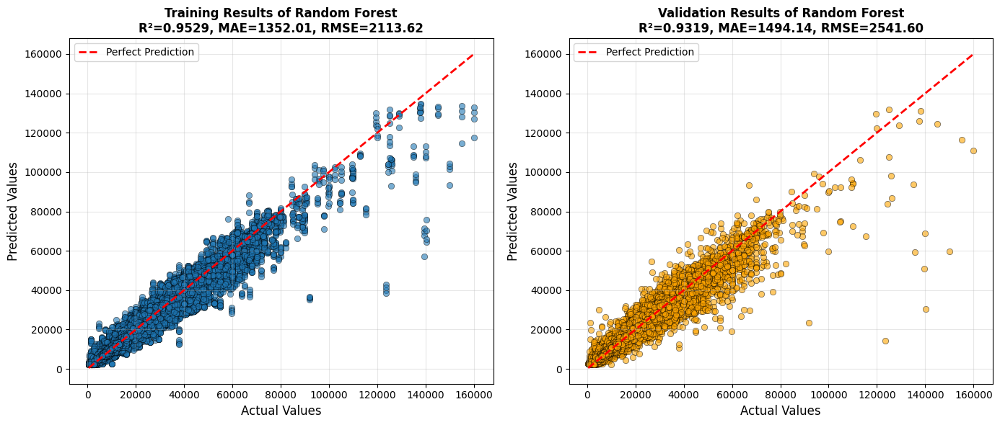

In [6]:
evaluate_best_model_with_cv(RF_tuned, X, y, model_name= "Random Forest", cv=5)

In this graph we can analyse a strong predcitive capability from the random search model, with a slight overfitting. It has good metrics such as R2 equal to 0.95 on train and 0.93 on validation, MAE is also good with 1352 and 1494, respectively. Only when it comes to expensive cars, the models shows more difficulties predicting it.

### Decision Tree Analysis

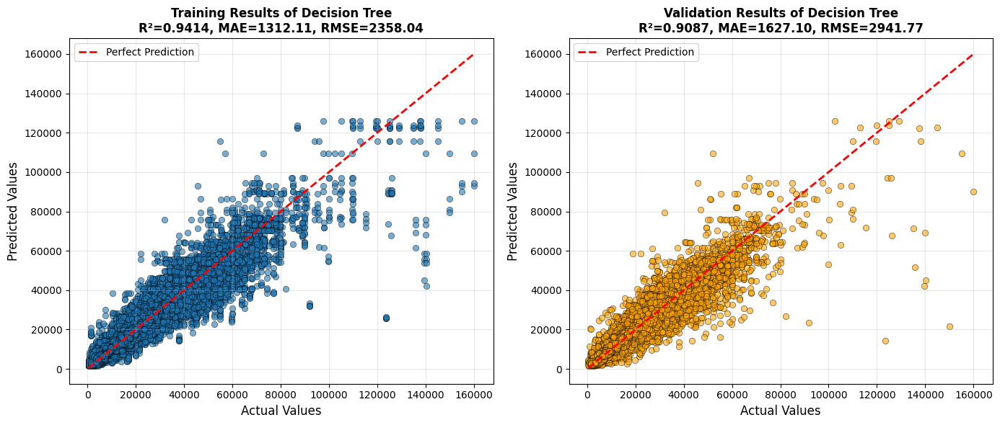

In [31]:
evaluate_best_model_with_cv(DT_tuned, X, y,model_name= "Decision Tree", cv=5)

Here we can verify a bit overfit in this model, as the difference between the MAE from train to validetion is higher than 300. For this reason, there's a low chance this model will be used in the next phase of optimization.

### Extra Trees Analysis

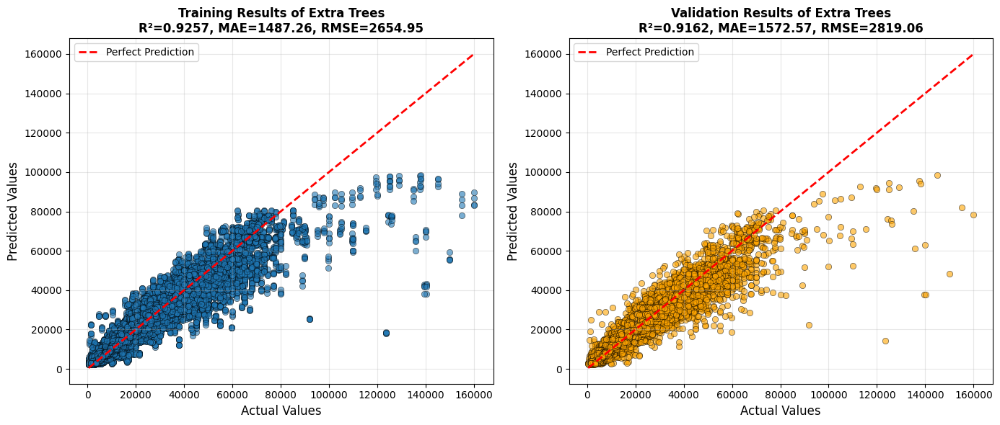

In [32]:
evaluate_best_model_with_cv(ET_tuned_best, X, y,model_name= "Extra Trees", cv=5)

This model show a goof capability of predicting cars bellow 80000, but higher than that no, even more cause it doesn't predict any value higher than 100000, which might tell us that this model is too pruned. Although, in general, the models reveal to be a good candidate model, as it doesn't overfit and has decent score metrics.

### Hist Gradient Boosting Analysis

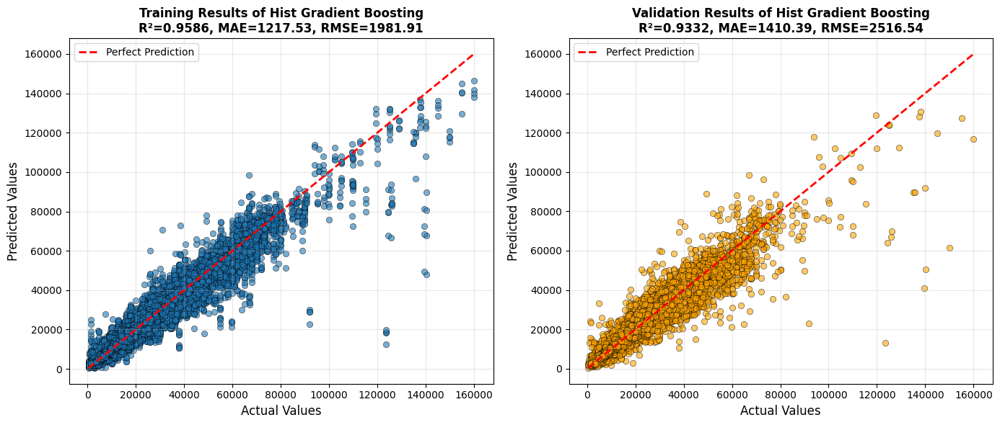

In [33]:
evaluate_best_model_with_cv(HGB_tuned_best, X, y,model_name= "Hist Gradient Boosting", cv=5)

This models shows some strong predictive capabilities on train and validation, as we can see mainly by the MAE metric. The downside is that is also reveals some levels of overfitting, as it has the difference of around 200 between thetrain and validation MAE. 

#### Final Conclusion

Based on these models performances, we'll continue to use in further optmization the Random Forest, Extra Trees and Hist Gradient Boosting. Decision Tree will be left out as it showed poorer predictive capabilities on validation, summed up with a high degree of overfitting.

Models to keep summary:
- Random Forest
- Extra Trees
- Hist Gradient Boosting